In [1]:
import os, shutil
os.chdir("../")
from pos import *
import pandas as pd
import seaborn as sns

In [2]:
def convert_individual_to_vecinos(individual,dist_crimen,n=n):
        
        vecinos=[[i,c] for i,c in zip(range(n),dist_crimen)]
        #print(vecinos)
        k=0
        for i in range(n-1):    
            I=i*n-k
            F=(i+1)*(n-1)-k
            k+=(i+1)
            #print(individual[I:F])
            v=np.where(individual[I:F])[0]+i+1
            
            for j in v:
                vecinos[i].append(j)
                vecinos[j].append(i)
        return vecinos

In [3]:
grupos = {'A':'Immune','B':'Susceptible','C':'Highly Susceptible'}
modelo='g_m_v'
crimen = 3
n=300
T=200
psi=0.98
nu=0.8
mu=0.14
lamda={'A':0,'B':0.005,'C':0.05}
q={'A':0.7,'B':0.2,'C':0.1}

In [4]:
def results(sol_path,folder):
    if os.path.exists(folder):
        shutil.rmtree(folder)
    os.mkdir(folder)
    sol=np.load(sol_path)
    dist_cr=dist_crimen(crimen,n,np.array(list((q.values()))))
    vecinos=convert_individual_to_vecinos(sol,dist_cr,n)
    G=convert_vertices_to_graph(vecinos)    
    draw_graph(G,np.ones(len(vecinos)),crime=crimen,labels=False,save=True,file=os.path.join(folder,"graph.pdf"),legends={"A":"Immune",'B':'Susceptible','C':'Higly susceptible'})
    fear=plot(vecinos,np.random.rand(n),lamda=lamda,psi=psi,nu=nu,mu=mu,modelo=modelo,T=200,save=True,f=os.path.join(folder,"simulation.pdf"),legends={"A":"Immune",'B':'Susceptible','C':'Higly susceptible'},draw=True,opt=True)
    assor_=assor(G)
    mm=mixing_matrix(G,normalized=True)
    mmn=mixing_matrix_normal(G)
    
    from plotly import express as px
    M=pd.DataFrame(mmn,columns=["Immune",'Susceptible','Higly susceptible'],index=["Immune",'Susceptible','Higly susceptible'])
    M=M.T.unstack().reset_index().rename(columns={'level_0':'Group 1','level_1':'Group 2',0:'Percent'})
    fig = px.bar(M, y="Group 1", color="Group 2", x='Percent', orientation='h',
                 height=300,width=550,
                 color_discrete_sequence= px.colors.qualitative.G10).for_each_trace(lambda t: t.update(name=t.name.replace("Group 2=",""))
                 )
    fig.update_yaxes(title_text='')
    fig.update_layout(legend_orientation="h")
    fig.update_layout(legend=dict(x=0, y=1.2))
    fig.show()
    
    print("fear mean",fear)
    print("Assortativity",assor_)
    print("Homofilia",homofilia(G))
    print("Mixing matrix")
    print(mm)
    print("Mixing matrix Normalized")
    print(mmn) 
    
    

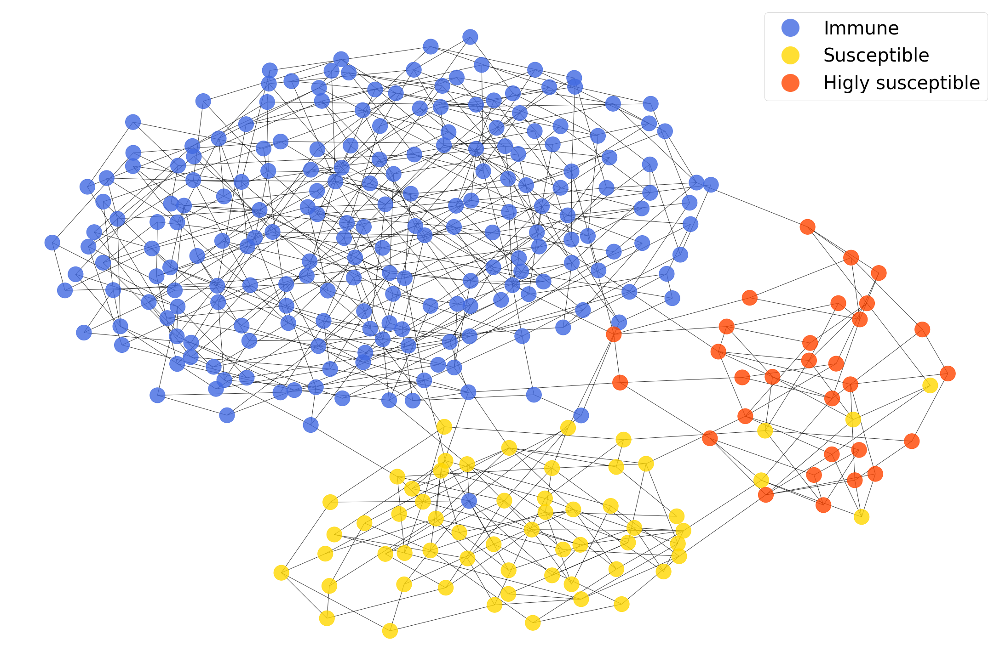

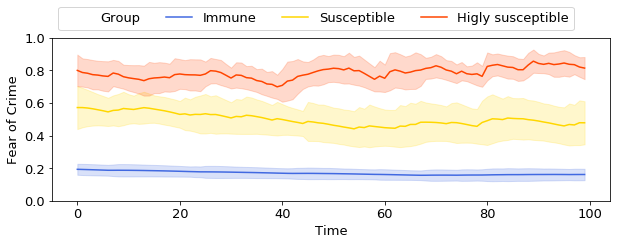

fear mean 0.2972589382745115
Assortativity 0.8675759230012465
Homofilia 0.9396411092985318
Mixing matrix
[[0.68841762 0.01141925 0.0040783 ]
 [0.01141925 0.17128874 0.01468189]
 [0.0040783  0.01468189 0.07993475]]
Mixing matrix Normalized
[[0.90987495 0.05257295 0.03755211]
 [0.0157754  0.84224599 0.14197861]
 [0.00642958 0.08101277 0.91255764]]


In [5]:
results("/home/cristian/Desktop/base_graph.npy","results_optimizacion/base_comp")

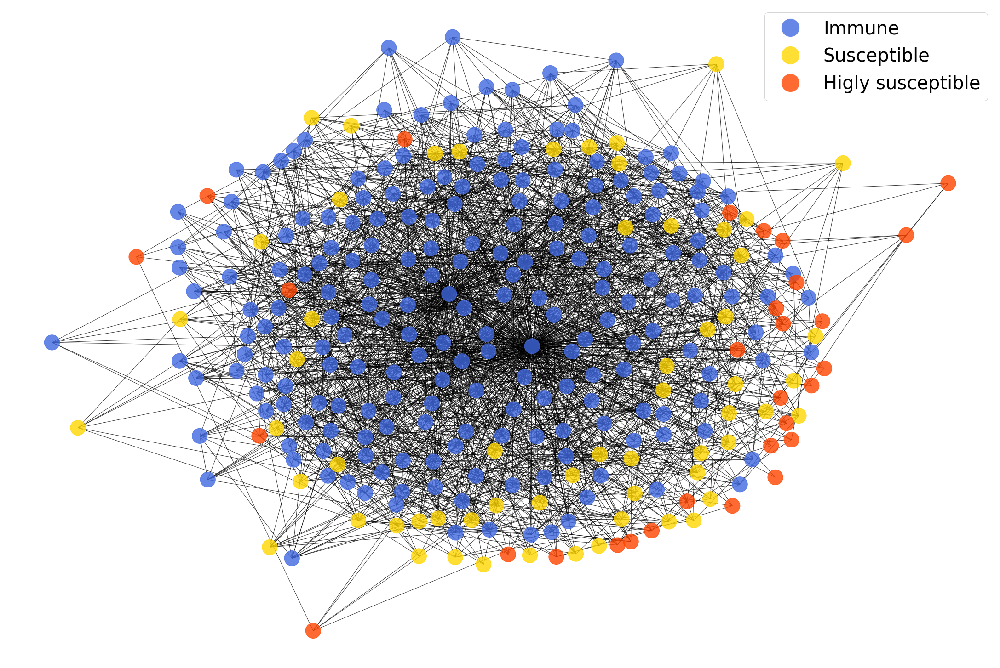

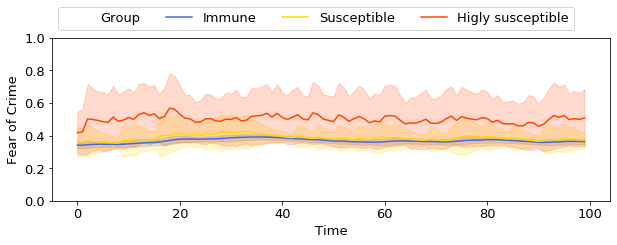

fear mean 0.38464608658982774
Assortativity 0.014598248827247029
Homofilia 0.6749764816556915
Mixing matrix
[[0.6476952  0.12088429 0.03480715]
 [0.12088429 0.02257761 0.00682032]
 [0.03480715 0.00682032 0.00470367]]
Mixing matrix Normalized
[[0.49394673 0.32112516 0.18492811]
 [0.48550342 0.32275107 0.19174551]
 [0.37532246 0.2574002  0.36727734]]


In [6]:
runs_folder="/home/cristian/Documents/FEAR/AG_main_exp/runs"
find_best={}
for i in os.listdir(runs_folder):
    A=pd.read_csv(os.path.join(runs_folder,i,"results_generations.csv"))
    find_best[i]=A['Fitness Best'].values[-1]
run_best=min(find_best, key=find_best.get)
sol_path=os.path.join(runs_folder,run_best,"best.npy")
folder="results_optimizacion/AG/"
results(sol_path,folder)

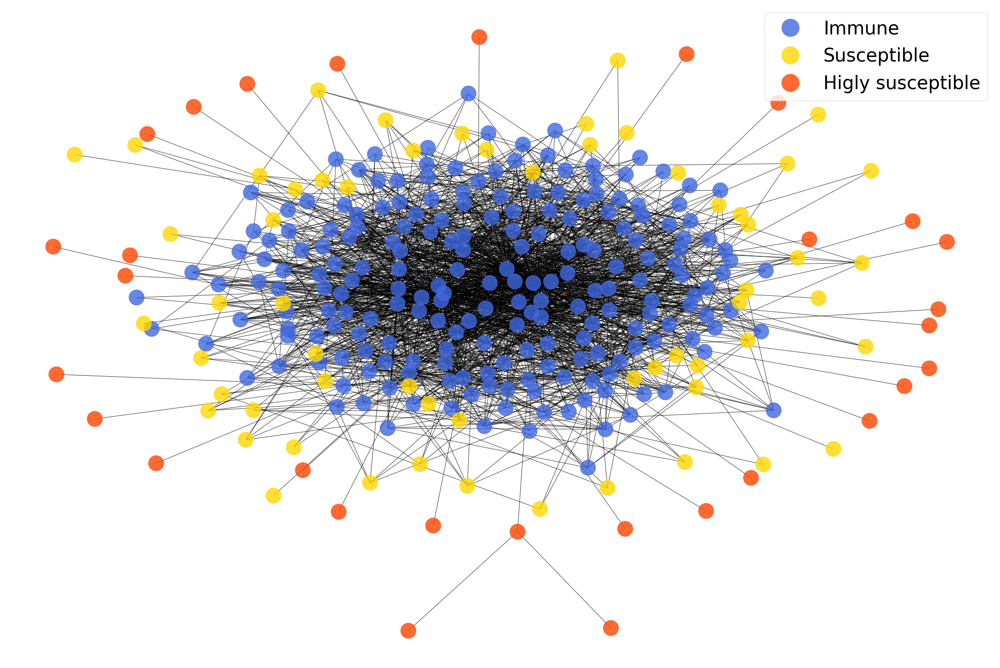

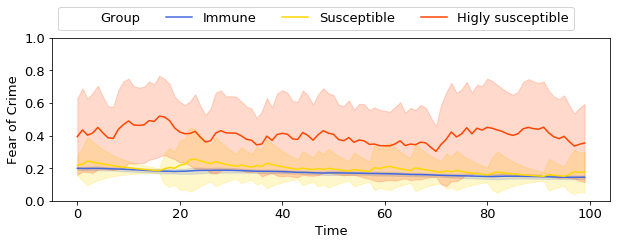

fear mean 0.19870261626231564
Assortativity 0.001716641322942391
Homofilia 0.8643306379155435
Mixing matrix
[[0.85938904 0.06154537 0.00628931]
 [0.06154537 0.00404313 0.        ]
 [0.00628931 0.         0.00089847]]
Mixing matrix Normalized
[[0.76896794 0.19182662 0.03920544]
 [0.81048832 0.18951168 0.        ]
 [0.49152542 0.         0.50847458]]


In [7]:
sol_path="/home/cristian/Documents/FEAR/best_898.npy"
results(sol_path,"results_optimizacion/haea")